# Check clustered dataflow

In [1]:
# https://ipython.org/ipython-doc/3/config/extensions/autoreload.html
%load_ext autoreload
%autoreload 2

In [2]:
import os 
import sys

root_path = os.path.abspath("..")
if root_path not in sys.path:
    sys.path.append(root_path)
    
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

from common.dataflow import get_train_df, get_test_df, get_image, get_target, get_inc_angle
from common.dataflow_visu_utils import display_image

Create clusters of images from training images.

Idea is to recover classes with big ships, small ships, big icebergs, small icebergs

In [3]:
train_df = get_train_df()

In [4]:
train_ships_df = train_df[train_df['is_iceberg'] == 0]
train_icebergs_df = train_df[train_df['is_iceberg'] == 1]

In [55]:
def compute_min_max_mean(df):
    min_vals = [] 
    max_vals = []
    mean_vals = []
    indices = df.index
    for i in indices:
        x = get_image(i, df) * 0.02
        min_vals.append((x[:, :, 0].min(), x[:, :, 1].min()))
        max_vals.append((x[:, :, 0].max(), x[:, :, 1].max()))
        mean_vals.append((x[:, :, 0].mean(), x[:, :, 1].mean()))

    min_vals = np.array(min_vals)
    max_vals = np.array(max_vals)
    mean_vals = np.array(mean_vals)
    return min_vals, max_vals, mean_vals

train_ships_min_vals, train_ships_max_vals, train_ships_mean_vals = compute_min_max_mean(train_ships_df)
train_icebergs_min_vals, train_icebergs_max_vals, train_icebergs_mean_vals = compute_min_max_mean(train_icebergs_df)

(-1, 1)

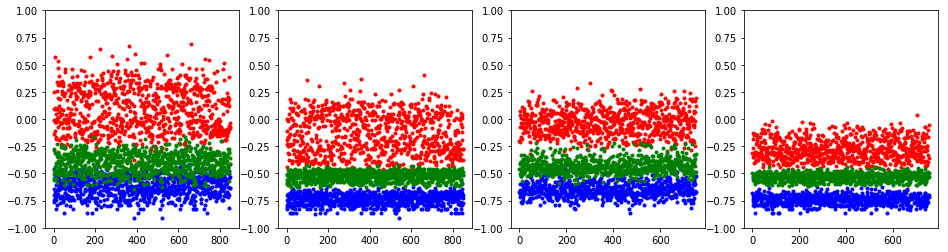

In [56]:
plt.figure(figsize=(16, 4))
plt.subplot(141)
plt.plot(train_ships_min_vals[:, 0], 'b.', label='mins')
plt.plot(train_ships_max_vals[:, 0], 'r.', label='maxs')
plt.plot(train_ships_mean_vals[:, 0], 'g.', label='mean')
plt.ylim([-1, 1])
plt.subplot(142)
plt.plot(train_ships_min_vals[:, 1], 'b.', label='mins')
plt.plot(train_ships_max_vals[:, 1], 'r.', label='maxs')
plt.plot(train_ships_mean_vals[:, 1], 'g.', label='mean')
plt.ylim([-1, 1])

plt.subplot(143)
plt.plot(train_icebergs_min_vals[:, 0], 'b.', label='mins')
plt.plot(train_icebergs_max_vals[:, 0], 'r.', label='maxs')
plt.plot(train_icebergs_mean_vals[:, 0], 'g.', label='mean')
plt.ylim([-1, 1])
plt.subplot(144)
plt.plot(train_icebergs_min_vals[:, 1], 'b.', label='mins')
plt.plot(train_icebergs_max_vals[:, 1], 'r.', label='maxs')
plt.plot(train_icebergs_mean_vals[:, 1], 'g.', label='mean')
plt.ylim([-1, 1])

In [ ]:
crop_size = 30

n_features = 3 * hist_size
X = np.zeros((len(id_type_list), n_features), dtype=np.float32)
for i, (image_id, image_type) in enumerate(id_type_list):
    print("--", i, len(id_type_list))
#     key = (image_id, image_type)
#     if key in cache:
#         img = cache.get(key)
#     else:
    img = get_cervix_image(image_id, image_type, None)
    
    # crop 
    proc = img[center[1]-crop_size:center[1]+crop_size,center[0]-crop_size:center[0]+crop_size,:]

In [6]:
import cv2

def compute_features(img, crop_size=None):

    h, w, c = img.shape
    # center crop
    if crop_size is not None:
        center = (w//2, h//2)
        img = img[center[1]-crop_size:center[1]+crop_size,center[0]-crop_size:center[0]+crop_size,:]
    
    min_vals = (img[:, :, 0].min(), img[:, :, 1].min())
    max_vals = (img[:, :, 0].max(), img[:, :, 1].max())
    mean_vals = (img[:, :, 0].mean(), img[:, :, 1].mean())
        
    return (*min_vals, *max_vals, *mean_vals)

In [8]:
image_size = (75, 75)

crop_size = 30
n_features = 6

X = np.zeros((len(train_ships_df), n_features), dtype=np.float32)
for i, index in enumerate(train_ships_df.index):
    print("--", i, len(train_ships_df))
    img = get_image(index, train_ships_df)    
    X[i, :] = compute_features(img)

-- 0 851
-- 1 851
-- 2 851
-- 3 851
-- 4 851
-- 5 851
-- 6 851
-- 7 851
-- 8 851
-- 9 851
-- 10 851
-- 11 851
-- 12 851
-- 13 851
-- 14 851
-- 15 851
-- 16 851
-- 17 851
-- 18 851
-- 19 851
-- 20 851
-- 21 851
-- 22 851
-- 23 851
-- 24 851
-- 25 851
-- 26 851
-- 27 851
-- 28 851
-- 29 851
-- 30 851
-- 31 851
-- 32 851
-- 33 851
-- 34 851
-- 35 851
-- 36 851
-- 37 851
-- 38 851
-- 39 851
-- 40 851
-- 41 851
-- 42 851
-- 43 851
-- 44 851
-- 45 851
-- 46 851
-- 47 851
-- 48 851
-- 49 851
-- 50 851
-- 51 851
-- 52 851
-- 53 851
-- 54 851
-- 55 851
-- 56 851
-- 57 851
-- 58 851
-- 59 851
-- 60 851
-- 61 851
-- 62 851
-- 63 851
-- 64 851
-- 65 851
-- 66 851
-- 67 851
-- 68 851
-- 69 851
-- 70 851
-- 71 851
-- 72 851
-- 73 851
-- 74 851
-- 75 851
-- 76 851
-- 77 851
-- 78 851
-- 79 851
-- 80 851
-- 81 851
-- 82 851
-- 83 851
-- 84 851
-- 85 851
-- 86 851
-- 87 851
-- 88 851
-- 89 851
-- 90 851
-- 91 851
-- 92 851
-- 93 851
-- 94 851
-- 95 851
-- 96 851
-- 97 851
-- 98 851
-- 99 851
-- 100 851

-- 804 851
-- 805 851
-- 806 851
-- 807 851
-- 808 851
-- 809 851
-- 810 851
-- 811 851
-- 812 851
-- 813 851
-- 814 851
-- 815 851
-- 816 851
-- 817 851
-- 818 851
-- 819 851
-- 820 851
-- 821 851
-- 822 851
-- 823 851
-- 824 851
-- 825 851
-- 826 851
-- 827 851
-- 828 851
-- 829 851
-- 830 851
-- 831 851
-- 832 851
-- 833 851
-- 834 851
-- 835 851
-- 836 851
-- 837 851
-- 838 851
-- 839 851
-- 840 851
-- 841 851
-- 842 851
-- 843 851
-- 844 851
-- 845 851
-- 846 851
-- 847 851
-- 848 851
-- 849 851
-- 850 851


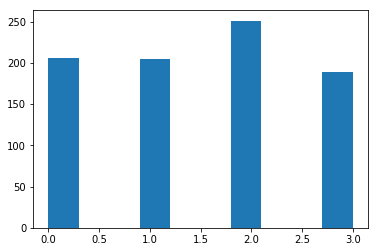

In [9]:
n_classes = 4

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=n_classes)
kmeans.fit(X)
y_classes = kmeans.predict(X)
_ = plt.hist(y_classes)

In [50]:
all_classes_images = []

for class_index in range(n_classes):    
    class_indices = np.where(y_classes == class_index)[0]
    n = 10    
    m = int(np.ceil(len(class_indices) / n)) 
    one_class_image = np.zeros((m*(image_size[0]+2), n*(image_size[1]+2), 3), dtype=np.float32)    
    
    counter = 0
    for i in range(m):
        ys = i*(image_size[1] + 2)
        ye = ys + image_size[1]
        for j in range(n):
            xs = j*(image_size[0] + 2)
            xe = xs + image_size[0]
            if counter == len(class_indices):
                break
            index = train_ships_df.index[class_indices[counter]]; counter+=1
            img = get_image(index, train_ships_df)
#             img = cv2.putText(img, str(index) + ' | ' + str(class_index), (5,img.shape[0] - 5), cv2.FONT_HERSHEY_PLAIN, 1.0, (255, 255, 255), thickness=2)
            one_class_image[ys:ye, xs:xe, 0] = img[:, :, 0]
            one_class_image[ys:ye, xs:xe, 1] = img[:, :, 1]     

        if counter == len(class_indices):
            break    
    all_classes_images.append(one_class_image)

In [51]:
from common.dataflow_visu_utils import scale_percentile

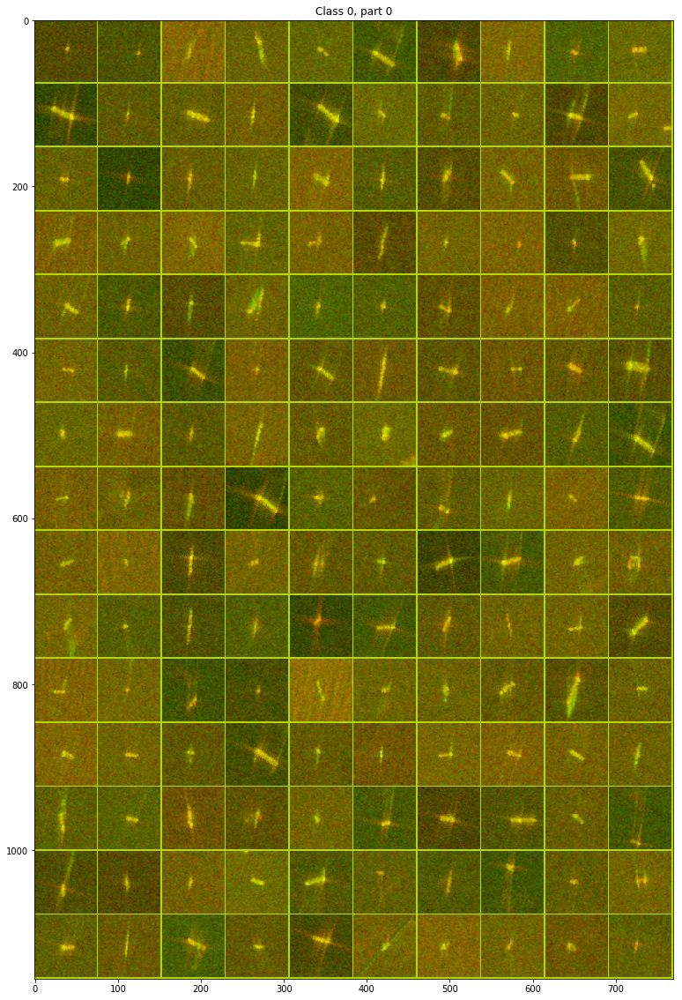

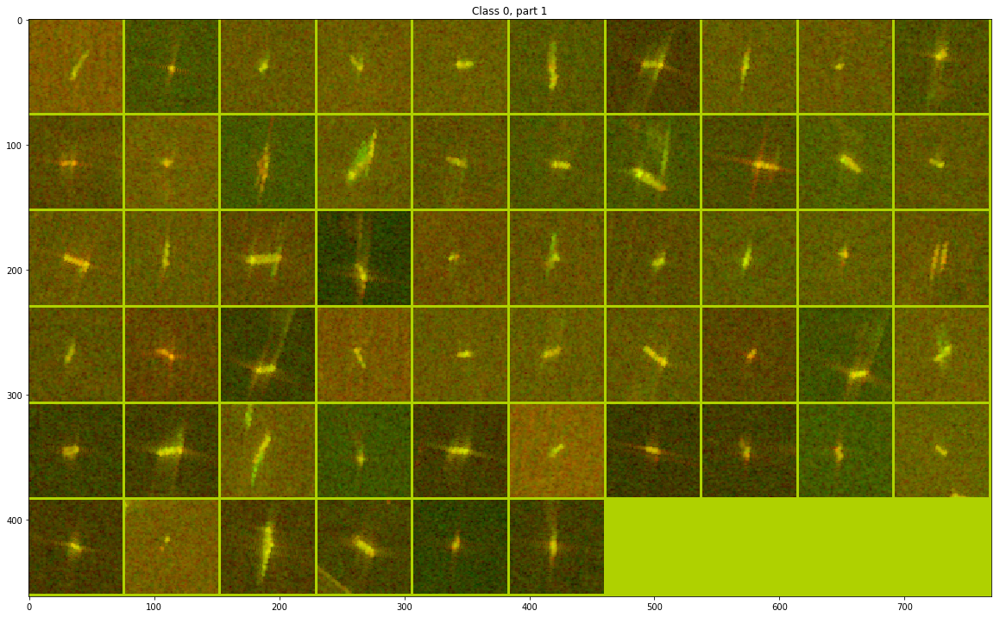

In [52]:
class_index = 0

m = all_classes_images[class_index].shape[0] / (image_size[0] + 2)
n = int(np.ceil(m / 15.0))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(image_size[0] + 2)*15
    ye = min((i+1)*(image_size[0] + 2)*15, all_classes_images[class_index].shape[0])
    plt.imshow(scale_percentile(all_classes_images[class_index][ys:ye,:,:], q_min=0.0, q_max=100.0))
    plt.title("Class %i, part %i" % (class_index, i))

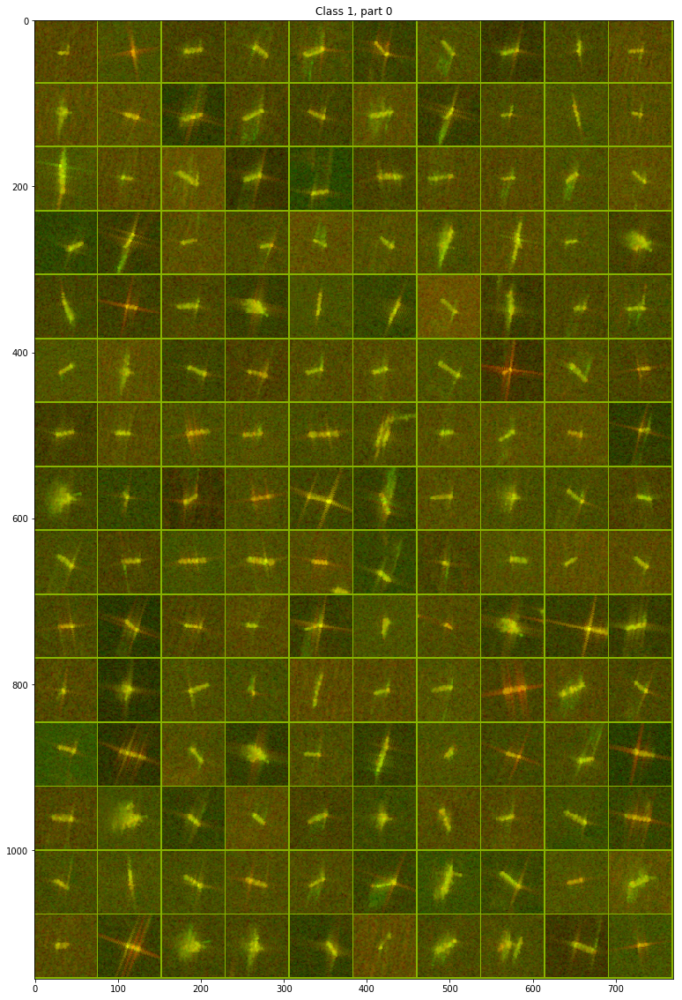

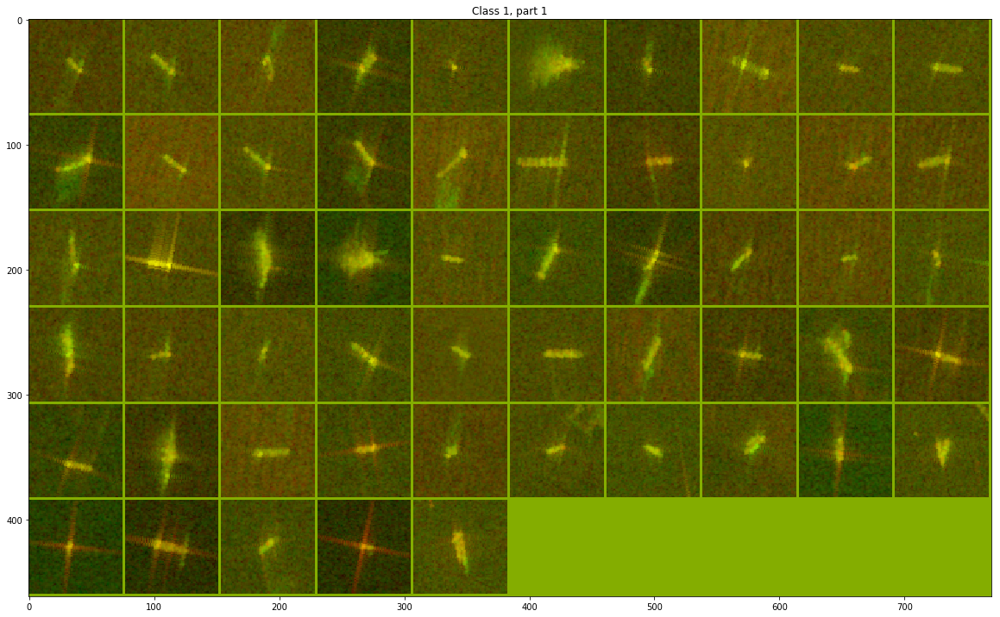

In [53]:
class_index = 1

m = all_classes_images[class_index].shape[0] / (image_size[0] + 2)
n = int(np.ceil(m / 15.0))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(image_size[0] + 2)*15
    ye = min((i+1)*(image_size[0] + 2)*15, all_classes_images[class_index].shape[0])
    plt.imshow(scale_percentile(all_classes_images[class_index][ys:ye,:,:], q_min=0.0, q_max=100.0))
    plt.title("Class %i, part %i" % (class_index, i))

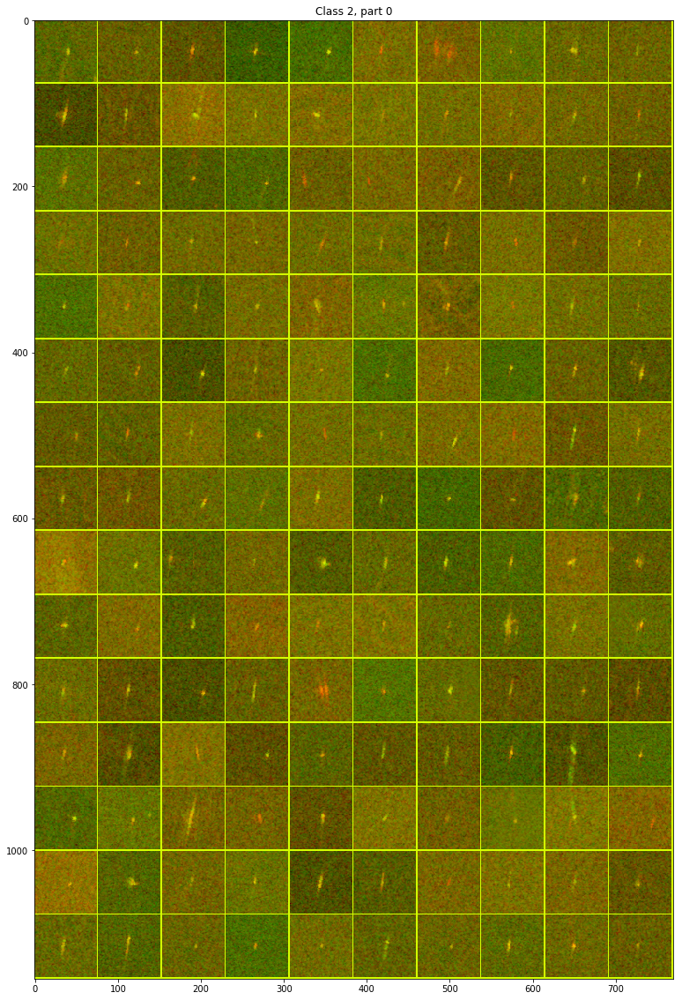

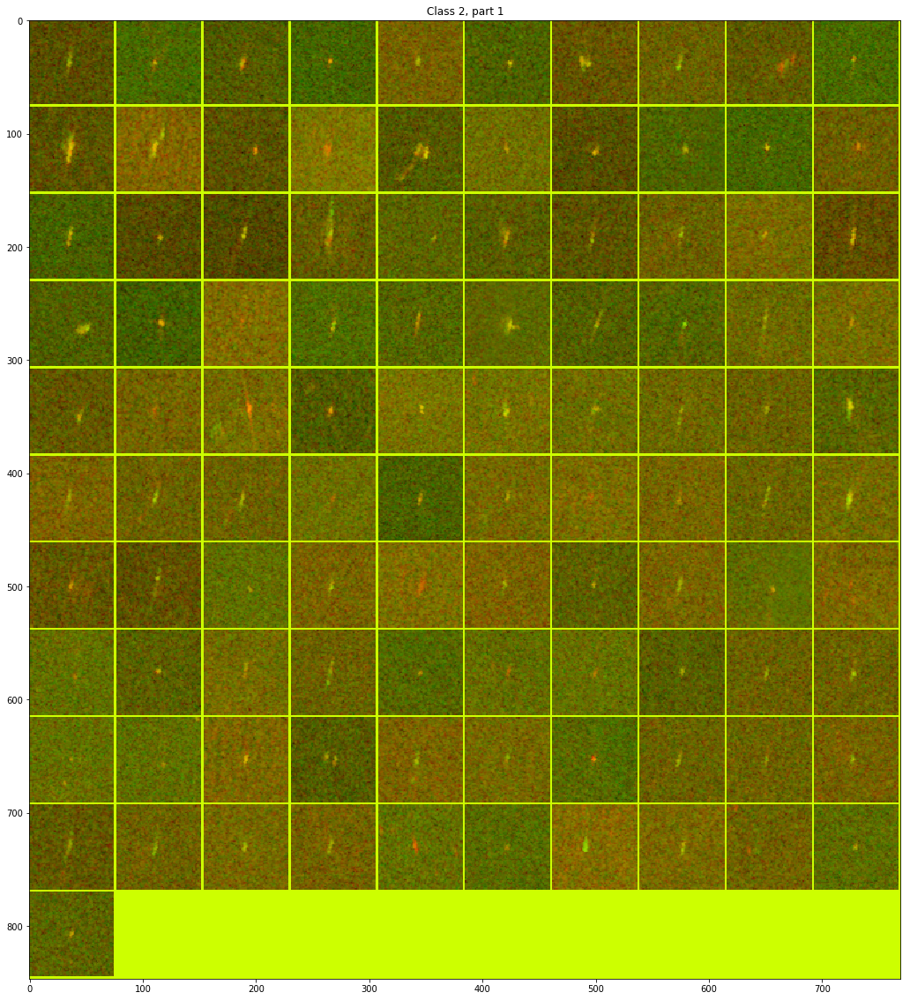

In [54]:
class_index = 2

m = all_classes_images[class_index].shape[0] / (image_size[0] + 2)
n = int(np.ceil(m / 15.0))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(image_size[0] + 2)*15
    ye = min((i+1)*(image_size[0] + 2)*15, all_classes_images[class_index].shape[0])
    plt.imshow(scale_percentile(all_classes_images[class_index][ys:ye,:,:], q_min=0.0, q_max=100.0))
    plt.title("Class %i, part %i" % (class_index, i))

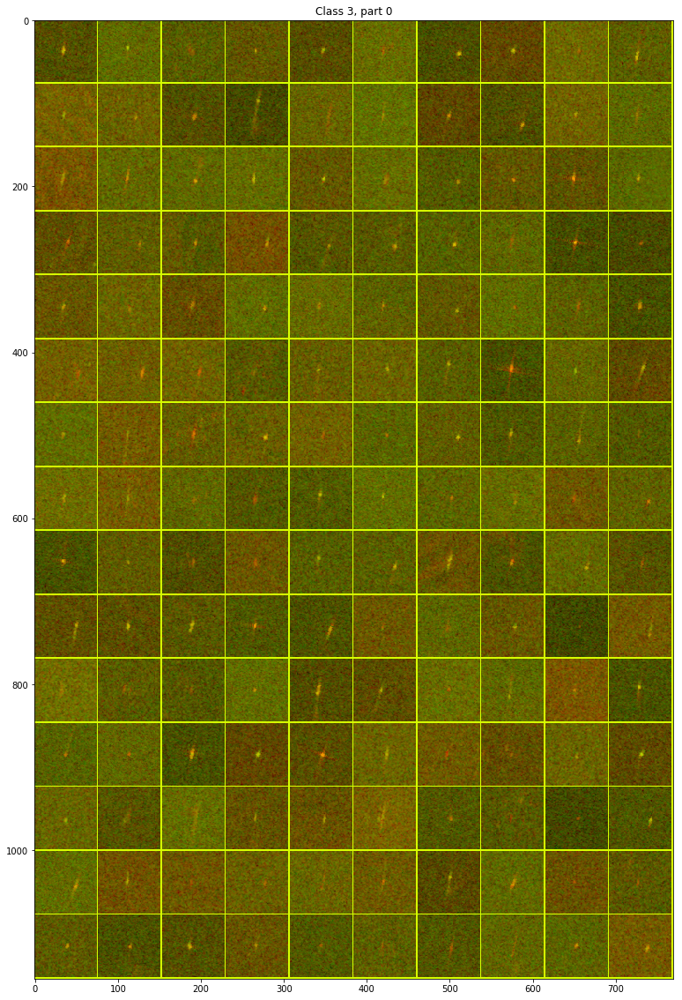

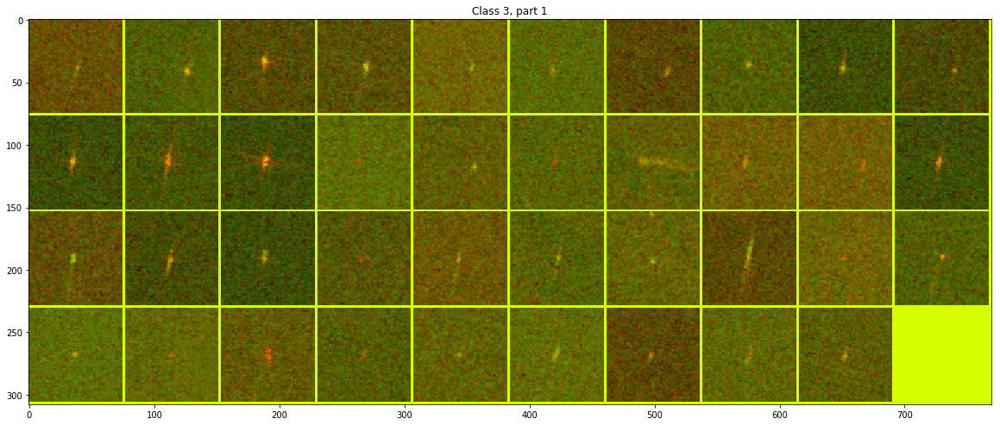

In [55]:
class_index = 3

m = all_classes_images[class_index].shape[0] / (image_size[0] + 2)
n = int(np.ceil(m / 15.0))
for i in range(n):
    plt.figure(figsize=(20, 20))
    ys = i*(image_size[0] + 2)*15
    ye = min((i+1)*(image_size[0] + 2)*15, all_classes_images[class_index].shape[0])
    plt.imshow(scale_percentile(all_classes_images[class_index][ys:ye,:,:], q_min=0.0, q_max=100.0))
    plt.title("Class %i, part %i" % (class_index, i))

-0.213149
-9.91848


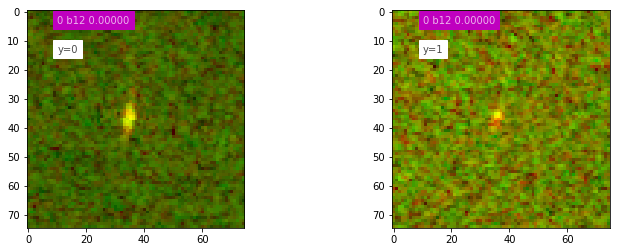

In [15]:
plt.figure(figsize=(12, 4))
ax = plt.subplot(121)
img = get_image(0, train_ships_df)
print(img.max())
display_image(ax, img, 0, 'b12', 0, target=0)

ax = plt.subplot(122)
img = get_image(2, train_icebergs_df)
print(img.max())
display_image(ax, img, 0, 'b12', 0, target=1)

In [ ]:
image_size = (299, 299)
center = (image_size[0]//2, image_size[1]//2)
hist_size = 30

crop_size = 30

n_features = 3 * hist_size
X = np.zeros((len(id_type_list), n_features), dtype=np.float32)
for i, (image_id, image_type) in enumerate(id_type_list):
    print("--", i, len(id_type_list))
#     key = (image_id, image_type)
#     if key in cache:
#         img = cache.get(key)
#     else:
    img = get_cervix_image(image_id, image_type, None)
    
    # crop 
    proc = img[center[1]-crop_size:center[1]+crop_size,center[0]-crop_size:center[0]+crop_size,:]
    # Blur 
    proc = cv2.GaussianBlur(proc, (7, 7), 0)
    hsv = cv2.cvtColor(proc, cv2.COLOR_RGB2HSV)
    hue = hsv[:,:,0]
    sat = hsv[:,:,1]
    val = hsv[:,:,2]
    hist_hue = compute_histogram(hue, hist_size)
    hist_sat = compute_histogram(sat, hist_size)    
    hist_val = compute_histogram(val, hist_size)    
    X[i, 0:hist_size] = hist_hue[:,0]
    X[i, hist_size:2*hist_size] = hist_sat[:,0]
    X[i, 2*hist_size:] = hist_val[:,0]

In [7]:
trainval_ds = IcebergDataset('Train')
test_ds = IcebergDataset('Test')

x:  <class 'numpy.ndarray'> (75, 75, 2) -38.2114 -0.213149 -41.1359 -11.2522
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -23.1253 12.5704 -34.7658 0.044052
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -33.3912 -9.91848 -34.1488 -15.6059
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -32.2041 4.79563 -39.5641 -5.55452
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -35.0105 -6.95604 -40.2761 -9.43401
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -29.7157 3.86404 -37.674 -9.12756
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -35.9261 -10.3501 -36.8422 -17.4397
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -37.3003 -13.9976 -37.2979 -22.1081
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -25.7325 28.5789 -34.252 -1.07451
y:  <class 'numpy.int64'> ()
x:  <class 'numpy.ndarray'> (75, 75, 2) -36.0653 -5.6063 -38

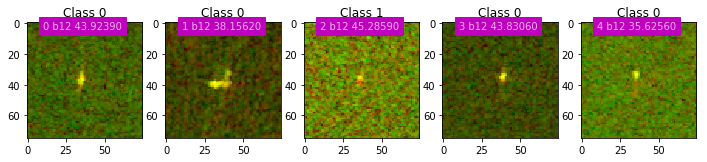

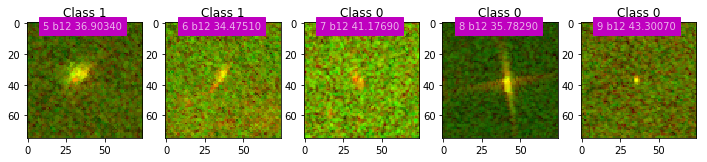

In [8]:
display_dataset(trainval_ds, max_datapoints=10, show_info=True)

In [10]:
%%timeit -r2 -n5
for (x, a), y in trainval_ds:
    x.sum()

1.26 s ± 10.5 ms per loop (mean ± std. dev. of 2 runs, 5 loops each)


x:  <class 'numpy.ndarray'> (75, 75, 2) -26.7006 7.28603 -34.3635 -16.2145
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -34.1768 -10.5493 -38.1012 -10.7599
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -34.0697 18.9681 -37.5925 19.0644
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -27.2938 1.69518 -35.0941 -6.58381
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -33.387 -8.12234 -35.8867 -8.77815
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -32.5693 6.89931 -30.9879 5.77728
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -37.1353 -5.83 -39.6348 -14.7732
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -29.9917 3.36454 -36.9303 -13.8703
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -33.0868 15.5735 -37.3044 0.552376
y:  <class 'str'> 8
x:  <class 'numpy.ndarray'> (75, 75, 2) -26.622 11.1458 -33.5917 5.93408
y:  <class 'str'> 8


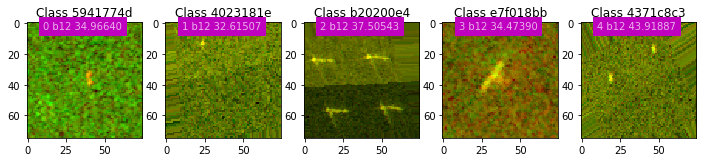

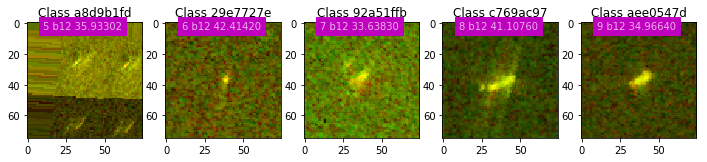

In [14]:
display_dataset(test_ds, max_datapoints=10, show_info=True)

Compute min, max, mean on the train dataset

In [16]:
def compute_min_max_mean(ds):
    min_vals = [] 
    max_vals = []
    mean_vals = []
    for (x, a), y in ds:
        min_vals.append((x[:, :, 0].min(), x[:, :, 1].min()))
        max_vals.append((x[:, :, 0].max(), x[:, :, 1].max()))
        mean_vals.append((x[:, :, 0].mean(), x[:, :, 1].mean()))

    min_vals = np.array(min_vals)
    max_vals = np.array(max_vals)
    mean_vals = np.array(mean_vals)
    return min_vals, max_vals, mean_vals

train_min_vals, train_max_vals, train_mean_vals = compute_min_max_mean(trainval_ds)
test_min_vals, test_max_vals, test_mean_vals = compute_min_max_mean(test_ds)

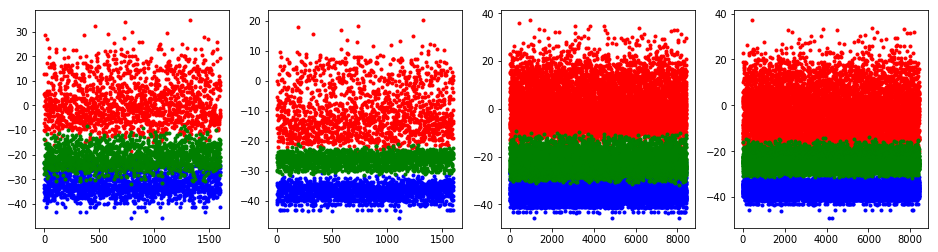

In [18]:
plt.figure(figsize=(16, 4))
plt.subplot(141)
plt.plot(train_min_vals[:, 0], 'b.', label='mins')
plt.plot(train_max_vals[:, 0], 'r.', label='maxs')
plt.plot(train_mean_vals[:, 0], 'g.', label='mean')
plt.subplot(142)
plt.plot(train_min_vals[:, 1], 'b.', label='mins')
plt.plot(train_max_vals[:, 1], 'r.', label='maxs')
plt.plot(train_mean_vals[:, 1], 'g.', label='mean')

plt.subplot(143)
plt.plot(test_min_vals[:, 0], 'b.', label='mins')
plt.plot(test_max_vals[:, 0], 'r.', label='maxs')
plt.plot(test_mean_vals[:, 0], 'g.', label='mean')
plt.subplot(144)
plt.plot(test_min_vals[:, 1], 'b.', label='mins')
plt.plot(test_max_vals[:, 1], 'r.', label='maxs')
plt.plot(test_mean_vals[:, 1], 'g.', label='mean')

In [11]:
np.percentile(mean_vals, q=50.0, axis=0), np.percentile(max_vals, q=97.0, axis=0) - np.percentile(min_vals, q=3.0, axis=0)

(array([-21.04982662, -26.15313911]), array([ 59.87096096,  48.35116971]))

In [9]:
import torch
from common.torch_common_utils.dataflow import TransformedDataset, OnGPUDataLoader
from common.dataflow import get_data_transforms

In [10]:
CONFIG = {
   "train_aug": {
    "Compose": {
      "transforms": [{
        "RandomChoice": {
          "transforms": [{
            "RandomAffine": {
              "translate": [0.1, 0.1],
              "rotation": [-90, 90],
              "interpolation": 0}}, {
            "RandomFlip": {
              "mode": "h",
              "proba": 0.75}}, {
            "RandomFlip": {
              "mode": "v",
              "proba": 0.75
            }}]}
      }, { "_ToTensor": {}}]}
  },

  "test_aug": {
    "Compose": {
      "transforms": [
        {"RandomAffine": {"translate": [0.05, 0.05], 
                            "rotation": [-2, 2],                                             
                            "interpolation": 0}},        
        {"RandomFlip": {"mode": "h", "proba": 0.5}},
        {"RandomFlip": {"mode": "v", "proba": 0.5}},
        {"_ToTensor": {}},
      ]
    }
  }    
}


train_aug = get_data_transforms(CONFIG['train_aug'])
test_aug = get_data_transforms(CONFIG['test_aug'])

In [11]:
from functools import partial

def x_transform(x, aug_fn):
    x, a = x
    x = aug_fn(x)
    return x, a

def y_transform(y):
    return torch.FloatTensor([int(y)])

In [13]:
train_aug_ds = TransformedDataset(trainval_ds, 
                                  x_transforms=partial(x_transform, aug_fn=train_aug), 
                                  y_transforms=y_transform)

val_aug_ds = TransformedDataset(trainval_ds, 
                                x_transforms=partial(x_transform, aug_fn=test_aug), 
                                y_transforms=y_transform)

test_aug_ds = TransformedDataset(test_ds, 
                                 x_transforms=partial(x_transform, aug_fn=test_aug))

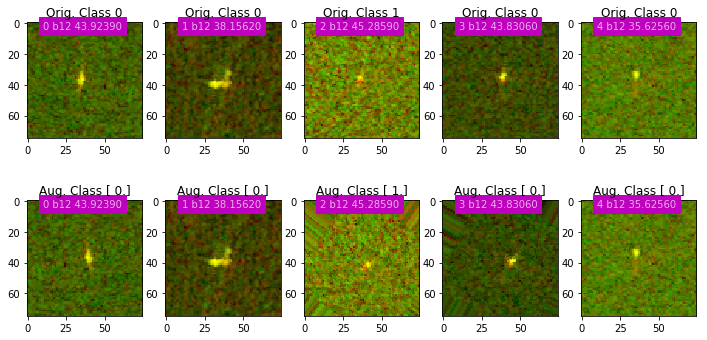

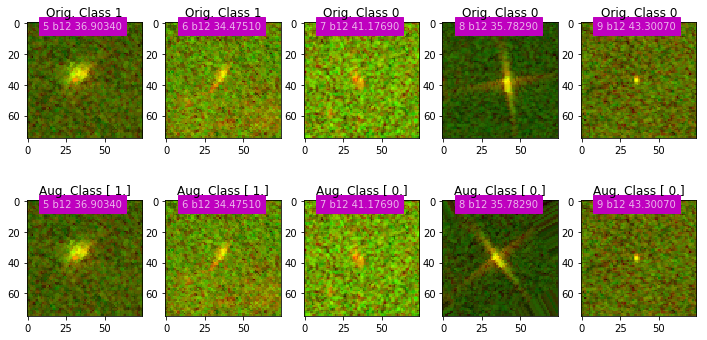

In [14]:
display_data_augmentations(trainval_ds, train_aug_ds, max_datapoints=10)

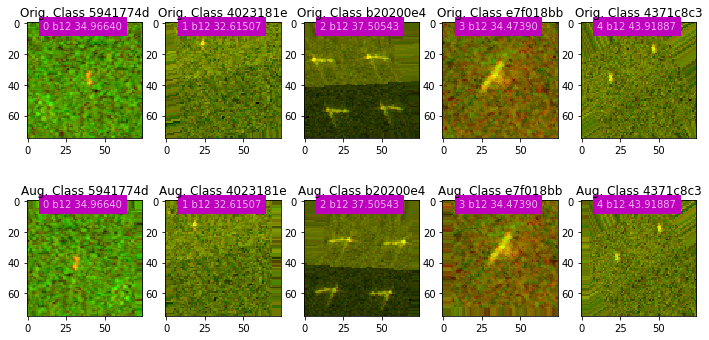

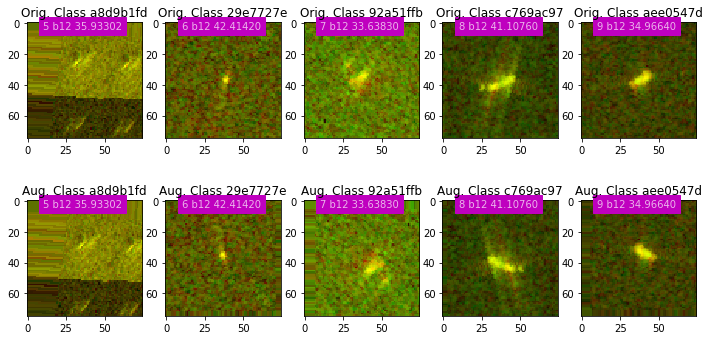

In [36]:
display_data_augmentations(test_ds, test_aug_ds, max_datapoints=10)

x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.2084464132785797 0.017939018085598946 -0.2348998636007309 0.012047681957483292
y:  <class 'torch.FloatTensor'> torch.Size([1])
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.1107146292924881 0.21140557527542114 -0.09983961284160614 0.22586502134799957
y:  <class 'torch.FloatTensor'> torch.Size([1])
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.1394559144973755 0.13642171025276184 -0.1353108286857605 0.10668763518333435
y:  <class 'torch.FloatTensor'> torch.Size([1])
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.22562623023986816 0.039507314562797546 -0.22562623023986816 0.039507314562797546
y:  <class 'torch.FloatTensor'> torch.Size([1])
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.13931481540203094 0.11556103080511093 -0.1699608713388443 0.09594287723302841
y:  <class 'torch.FloatTensor'> torch.Size([1])


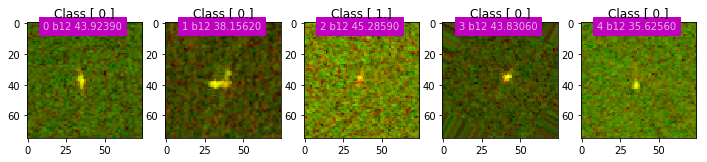

In [37]:
display_dataset(train_aug_ds, max_datapoints=5, show_info=True)

x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.10331012308597565 0.2831946015357971 -0.08894254267215729 0.26772546768188477
y:  <class 'str'> 8
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.3069380223751068 0.20349660515785217 -0.38164833188056946 0.20349660515785217
y:  <class 'str'> 8
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.29579561948776245 0.5852508544921875 -0.29579561948776245 0.5852508544921875
y:  <class 'str'> 8
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.1498565524816513 0.29987770318984985 -0.2984412610530853 0.29271888732910156
y:  <class 'str'> 8
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.26134005188941956 0.2678515613079071 -0.26134005188941956 0.2678515613079071
y:  <class 'str'> 8
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.18501952290534973 0.6456627249717712 -0.2036045789718628 0.7422385215759277
y:  <class 'str'> 8
x:  <class 'torch.FloatTensor'> torch.Size([2, 75, 75]) -0.4100

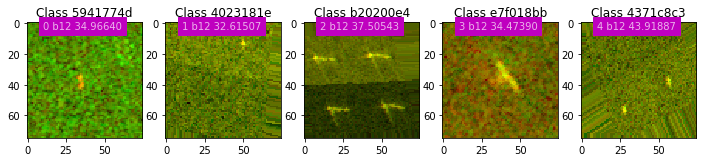

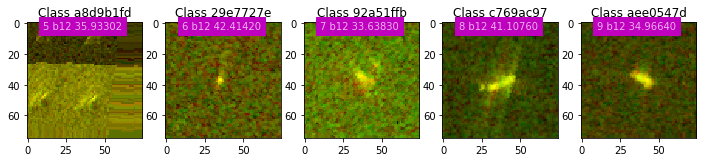

In [43]:
display_dataset(test_aug_ds, max_datapoints=10, show_info=True)

In [31]:
CONFIG = {
    'batch_size': 10,
    'num_workers': 12,
    'n_splits': 10,
    'val_size': 0.10,

    'seed': 12345
}

In [33]:
y_array = []
x_array = []
for i, ((x, a), y) in enumerate(trainval_ds):
    y_array.append(y)
    x_array.append(i)    

In [34]:
from sklearn.model_selection import StratifiedShuffleSplit
# Stratified split:        
sssplit = StratifiedShuffleSplit(n_splits=CONFIG['n_splits'], 
                                 test_size=CONFIG['val_size'], 
                                 random_state=CONFIG['seed'])
train_indices, val_indices = next(sssplit.split(x_array, y_array))

In [35]:
from torch.utils.data.sampler import SubsetRandomSampler
train_sampler = SubsetRandomSampler(train_indices)
val_sampler = SubsetRandomSampler(val_indices)

In [39]:
train_batches = OnGPUDataLoader(train_aug_ds,
                                batch_size=CONFIG['batch_size'],
                                sampler=train_sampler,
                                num_workers=CONFIG['num_workers'],
                                drop_last=True,
                                pin_memory=True)

val_batches = OnGPUDataLoader(val_aug_ds,
                              batch_size=CONFIG['batch_size'],
                              sampler=val_sampler,
                              num_workers=CONFIG['num_workers'],
                              drop_last=True,
                              pin_memory=True)

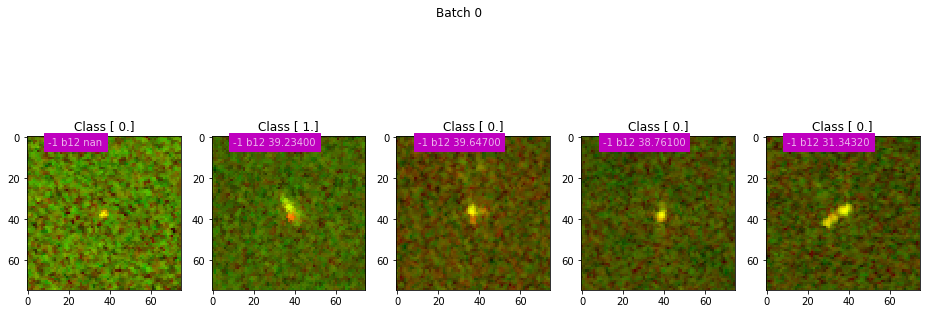

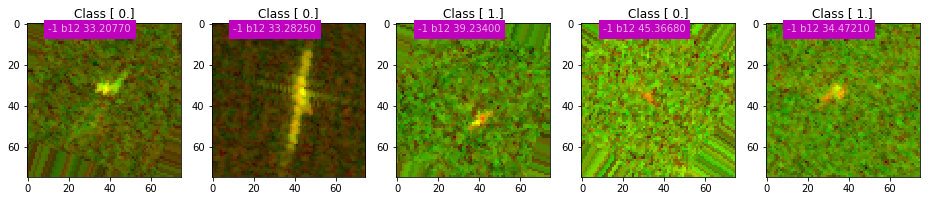

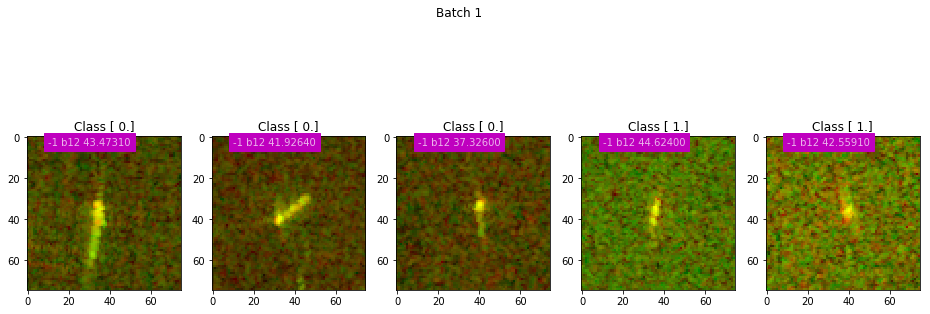

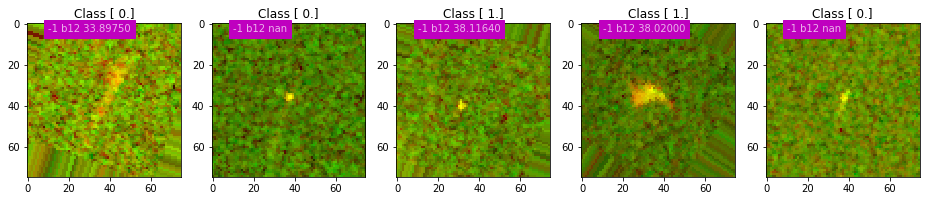

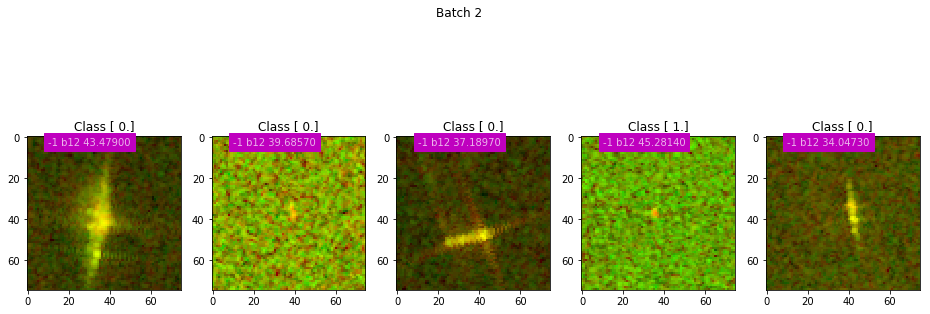

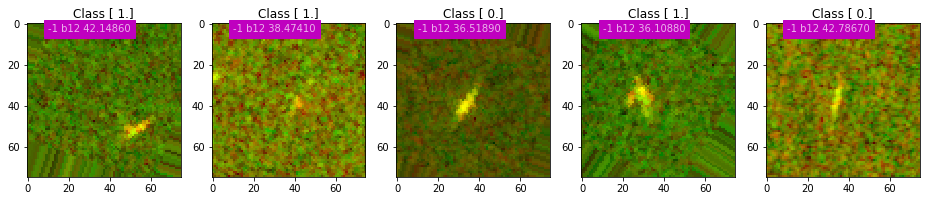

In [40]:
display_batches(train_batches)